# Final Project - ATDL

## U-Net Architecture for CGAN - Image Colorization
<br>

Inon Elgabsi: 207709551

Nati Forish: 208687004

Iyar Gadolov: 206905754

Roy Edri: 214099046


# Download the data set

## Download libraries and imports

In [ ]:
%%capture
!pip install kagglehub ipywidgets pillow matplotlib scipy
!pip install tensorflow
!pip install keras
!pip install ipython-autotime
%load_ext autotime


time: 325 µs (started: 2025-03-19 19:18:54 +00:00)


## Login Kaggle Account

In [ ]:
import ipywidgets as widgets
from IPython.display import display
import os
from kaggle.api.kaggle_api_extended import KaggleApi
import shutil

username = widgets.Text(placeholder="Enter username", description="Username:")
api_key = widgets.Password(placeholder="Enter API key", description="API Key:")
login_btn = widgets.Button(description="Login")
output = widgets.Output()
display(username, api_key, login_btn, output)

def on_login(b):
    os.environ["KAGGLE_USERNAME"] = username.value
    os.environ["KAGGLE_KEY"] = api_key.value
    with output:
        try:
            api = KaggleApi()
            api.authenticate()
            print("Authenticated successfully!")
        except Exception as e:
            print("Authentication failed:", e)

login_btn.on_click(on_login)


Text(value='', description='Username:', placeholder='Enter username')

Password(description='API Key:', placeholder='Enter API key')

Button(description='Login', style=ButtonStyle())

Output()

time: 16 ms (started: 2025-03-19 19:18:57 +00:00)


Define the dataset and download location


In [ ]:
dataset = "davemahony/20-uk-garden-birds"
download_path = "./"

time: 356 µs (started: 2025-03-19 19:19:06 +00:00)


In [ ]:
import os
import shutil
from kaggle.api.kaggle_api_extended import KaggleApi

api = KaggleApi()
api.authenticate()

api.dataset_download_files(dataset, path=download_path, unzip=True)
print("Dataset downloaded to:", download_path)

expected_folder = os.path.join(download_path, "20-uk-garden-birds")
destination_path = os.path.join(".", "birds_dataset")
os.makedirs(destination_path, exist_ok=True)

if os.path.exists(expected_folder):
    shutil.copytree(expected_folder, destination_path, dirs_exist_ok=True)
    print(f"Data successfully copied to {destination_path}")
else:
    downloaded_items = os.listdir(download_path)
    print("Expected folder '20-uk-garden-birds' not found.")
    print("Downloaded items:", downloaded_items)

    folders_to_move = []
    for folder in downloaded_items:
        if folder in ["with_background", "without_background"]:
            folders_to_move.append(folder)

    for folder in folders_to_move:
        src_folder = os.path.join(download_path, folder)
        dest_folder = os.path.join(destination_path, folder)
        shutil.move(src_folder, dest_folder)
        print(f"Moved {folder} to {destination_path}")

    if not folders_to_move:
        print("No expected folders were found to move.")


Dataset URL: https://www.kaggle.com/datasets/davemahony/20-uk-garden-birds
Dataset downloaded to: ./
Expected folder '20-uk-garden-birds' not found.
Downloaded items: ['.config', 'birds.csv', 'birds_dataset', 'withoutBackground', 'stats.xlsx', 'withBackground', 'sample_data']
No expected folders were found to move.
time: 21.9 s (started: 2025-03-19 19:19:08 +00:00)


In [ ]:
expected_folder = os.path.join(download_path, "20-uk-garden-birds")
destination_path = os.path.join(".", "birds_dataset")

time: 376 µs (started: 2025-03-19 19:19:30 +00:00)


In [ ]:
import os
import shutil
from kaggle.api.kaggle_api_extended import KaggleApi

api = KaggleApi()
api.authenticate()

api.dataset_download_files(dataset, path=download_path, unzip=True)
print("Dataset downloaded to:", download_path)

expected_folder = os.path.join(download_path, "20-uk-garden-birds")
destination_path = os.path.join(".", "birds_dataset")
os.makedirs(destination_path, exist_ok=True)

if os.path.exists(expected_folder):
    shutil.copytree(expected_folder, destination_path, dirs_exist_ok=True)
    print(f"Data successfully copied to {destination_path}")
else:
    downloaded_items = os.listdir(download_path)
    print("Expected folder '20-uk-garden-birds' not found.")
    print("Downloaded items:", downloaded_items)

    folders_to_move = []
    for folder in downloaded_items:
        if folder in ["with_background", "without_background"]:
            folders_to_move.append(folder)

    for folder in folders_to_move:
        src_folder = os.path.join(download_path, folder)
        dest_folder = os.path.join(destination_path, folder)
        shutil.move(src_folder, dest_folder)
        print(f"Moved {folder} to {destination_path}")

    if not folders_to_move:
        print("No expected folders were found to move.")


Dataset URL: https://www.kaggle.com/datasets/davemahony/20-uk-garden-birds
Dataset downloaded to: ./
Expected folder '20-uk-garden-birds' not found.
Downloaded items: ['.config', 'birds.csv', 'birds_dataset', 'withoutBackground', 'stats.xlsx', 'withBackground', 'sample_data']
No expected folders were found to move.
time: 22.5 s (started: 2025-03-19 19:19:30 +00:00)


## Creat train, test folders

In [ ]:
import random
import os

dataset_path = os.path.join(".", "withBackground")

train_path = os.path.join(destination_path, "train")
test_path  = os.path.join(destination_path, "test")
os.makedirs(train_path, exist_ok=True)
os.makedirs(test_path, exist_ok=True)

categories = os.listdir(dataset_path)
for category in categories:
    src_folder = os.path.join(dataset_path, category)
    if not os.path.isdir(src_folder):
        continue

    os.makedirs(os.path.join(train_path, category), exist_ok=True)
    os.makedirs(os.path.join(test_path, category), exist_ok=True)

    images = os.listdir(src_folder)
    random.shuffle(images)
    split_idx = int(len(images) * 0.8)

    for img in images[:split_idx]:
        shutil.copy(os.path.join(src_folder, img),
                    os.path.join(train_path, category, img))
    for img in images[split_idx:]:
        shutil.copy(os.path.join(src_folder, img),
                    os.path.join(test_path, category, img))

print("Successfully split data into Train and Test sets!")


Successfully split data into Train and Test sets!
time: 458 ms (started: 2025-03-19 19:19:52 +00:00)


# Model 1 - pix2pix U-Net Architecture

**Develop a CGAN for colorization using a U-Net generator and a PatchGAN discriminator. The goal is to generate sharper and more realistic color images from grayscale inputs by combining adversarial loss with an L1 reconstruction term.**

## Data Augmentation




In [ ]:
import tensorflow as tf

IMG_SIZE = 128
BATCH_SIZE = 10

def load_image(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
    image = (image / 127.5) - 1
    return image

def random_jitter(gray, color):
    gray_resized = tf.image.resize(gray, [143, 143])
    color_resized = tf.image.resize(color, [143, 143])

    offset_height = tf.random.uniform(shape=[], minval=0, maxval=143 - IMG_SIZE + 1, dtype=tf.int32)
    offset_width = tf.random.uniform(shape=[], minval=0, maxval=143 - IMG_SIZE + 1, dtype=tf.int32)

    gray_cropped = tf.image.crop_to_bounding_box(gray_resized, offset_height, offset_width, IMG_SIZE, IMG_SIZE)
    color_cropped = tf.image.crop_to_bounding_box(color_resized, offset_height, offset_width, IMG_SIZE, IMG_SIZE)

    if tf.random.uniform(()) > 0.5:
        gray_cropped = tf.image.flip_left_right(gray_cropped)
        color_cropped = tf.image.flip_left_right(color_cropped)

    return gray_cropped, color_cropped

def preprocess_train(image):
    color_image = load_image(image)
    gray_image = tf.image.rgb_to_grayscale(color_image)
    gray_image, color_image = random_jitter(gray_image, color_image)
    return gray_image, color_image


def preprocess_test(image):
    color_image = load_image(image)
    gray_image = tf.image.rgb_to_grayscale(color_image)
    return gray_image, color_image

def get_file_list(directory):
    file_list = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                file_list.append(os.path.join(root, file))
    return file_list

train_files = get_file_list(train_path)
val_files = get_file_list(test_path)

print("Number of training images:", len(train_files))
print("Number of validation images:", len(val_files))

train_dataset = tf.data.Dataset.from_tensor_slices(train_files)
train_dataset = train_dataset.map(preprocess_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices(val_files)
val_dataset = val_dataset.map(preprocess_test, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


Number of training images: 2270
Number of validation images: 571
time: 4.89 s (started: 2025-03-19 19:19:53 +00:00)


## Generator

Generator Architecture & Hyperparameters:

Encoder–Decoder (U-Net):

- Six encoder blocks built with Conv2D layers, LeakyReLU activations, and batch normalization.
- Six corresponding decoder blocks using Conv2DTranspose layers, dropout (in the first three decoder layers, rate = 0.5), and skip connections to retain spatial details.
- Final output activation: Tanh (to produce outputs in the range
[−1,1]).

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

def build_pix2pix_generator(input_shape=(128, 128, 1)):
    initializer = tf.random_normal_initializer(0., 0.02)
    inputs = layers.Input(shape=input_shape)

    e1 = layers.Conv2D(64, 4, strides=2, padding='same', kernel_initializer=initializer)(inputs)
    e1 = layers.LeakyReLU(0.2)(e1)

    e2 = layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(e1)
    e2 = layers.BatchNormalization()(e2)
    e2 = layers.LeakyReLU(0.2)(e2)

    e3 = layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(e2)
    e3 = layers.BatchNormalization()(e3)
    e3 = layers.LeakyReLU(0.2)(e3)

    e4 = layers.Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(e3)
    e4 = layers.BatchNormalization()(e4)
    e4 = layers.LeakyReLU(0.2)(e4)

    e5 = layers.Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(e4)
    e5 = layers.BatchNormalization()(e5)
    e5 = layers.LeakyReLU(0.2)(e5)

    e6 = layers.Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(e5)
    e6 = layers.BatchNormalization()(e6)
    e6 = layers.LeakyReLU(0.2)(e6)

    e7 = layers.Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(e6)
    e7 = layers.Activation('relu')(e7)

    d1 = layers.Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(e7)
    d1 = layers.BatchNormalization()(d1)
    d1 = layers.Dropout(0.5)(d1)
    d1 = layers.Concatenate()([d1, e6])

    d2 = layers.Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(d1)
    d2 = layers.BatchNormalization()(d2)
    d2 = layers.Dropout(0.5)(d2)
    d2 = layers.Concatenate()([d2, e5])

    d3 = layers.Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(d2)
    d3 = layers.BatchNormalization()(d3)
    d3 = layers.Dropout(0.5)(d3)
    d3 = layers.Concatenate()([d3, e4])

    d4 = layers.Conv2DTranspose(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(d3)
    d4 = layers.BatchNormalization()(d4)
    d4 = layers.Concatenate()([d4, e3])

    d5 = layers.Conv2DTranspose(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(d4)
    d5 = layers.BatchNormalization()(d5)
    d5 = layers.Concatenate()([d5, e2])

    d6 = layers.Conv2DTranspose(64, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(d5)
    d6 = layers.BatchNormalization()(d6)
    d6 = layers.Concatenate()([d6, e1])

    d7 = layers.Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer)(d6)
    outputs = layers.Activation('tanh')(d7)

    return tf.keras.Model(inputs=inputs, outputs=outputs)

generator = build_pix2pix_generator()
generator.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 1)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 64, 64, 64)     │          1,088 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu (LeakyReLU)   │ (None, 64, 64, 64)     │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 32, 32, 128)    │        131,072 │ leaky_re_lu[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 32, 32, 128)    │            512 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_1 (LeakyReLU) │ (None, 32, 32, 128)    │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 16, 16, 256)    │        524,288 │ leaky_re_lu_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 16, 16, 256)    │          1,024 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_2 (LeakyReLU) │ (None, 16, 16, 256)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 8, 8, 512)      │      2,097,152 │ leaky_re_lu_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 8, 8, 512)      │          2,048 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_3 (LeakyReLU) │ (None, 8, 8, 512)      │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 4, 4, 512)      │      4,194,304 │ leaky_re_lu_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 4, 4, 512)      │          2,048 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_4 (LeakyReLU) │ (None, 4, 4, 512)      │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 2, 2, 512)      │      4,194,304 │ leaky_re_lu_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 2, 2, 512)      │          2,048 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 41,834,819 (159.59 MB)

 Trainable params: 41,827,011 (159.56 MB)

 Non-trainable params: 7,808 (30.50 KB)

time: 302 ms (started: 2025-03-19 19:19:58 +00:00)


## Descriminator

Patch size 70x70 (receptive field)

In [ ]:
def build_discriminator(input_shape=(IMG_SIZE, IMG_SIZE, 1), target_shape=(IMG_SIZE, IMG_SIZE, 3)):
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = layers.Input(shape=input_shape, name='input_image')
    tar = layers.Input(shape=target_shape, name='target_image')

    x = layers.Concatenate()([inp, tar])

    x = layers.Conv2D(64, 4, strides=2, padding='same', kernel_initializer=initializer)(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(512, 4, strides=1, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(1, 4, strides=1, padding='same', kernel_initializer=initializer)(x)
    outputs = layers.Activation('sigmoid')(x)

    return tf.keras.Model(inputs=[inp, tar], outputs=outputs)

discriminator = build_discriminator()
discriminator.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)  │ (None, 128, 128, 1)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ target_image (InputLayer) │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_6             │ (None, 128, 128, 4)    │              0 │ input_image[0][0],     │
│ (Concatenate)             │                        │                │ target_image[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 64, 64, 64)     │          4,160 │ concatenate_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_6 (LeakyReLU) │ (None, 64, 64, 64)     │              0 │ conv2d_7[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 32, 32, 128)    │        131,072 │ leaky_re_lu_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_11    │ (None, 32, 32, 128)    │            512 │ conv2d_8[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_7 (LeakyReLU) │ (None, 32, 32, 128)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 16, 16, 256)    │        524,288 │ leaky_re_lu_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_12    │ (None, 16, 16, 256)    │          1,024 │ conv2d_9[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_8 (LeakyReLU) │ (None, 16, 16, 256)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_10 (Conv2D)        │ (None, 16, 16, 512)    │      2,097,152 │ leaky_re_lu_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_13    │ (None, 16, 16, 512)    │          2,048 │ conv2d_10[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_9 (LeakyReLU) │ (None, 16, 16, 512)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_11 (Conv2D)        │ (None, 16, 16, 1)      │          8,193 │ leaky_re_lu_9[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 16, 16, 1)      │              0 │ conv2d_11[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,768,449 (10.56 MB)

 Trainable params: 2,766,657 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)

time: 71.3 ms (started: 2025-03-19 19:19:58 +00:00)


## Define loss - Discriminator and Generator

* use pix2pix learning rate (G:2e-4 , D:1e-4)

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=False)

def generator_loss(disc_generated_output, gen_output, target, LAMBDA=100):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_loss = gan_loss + (LAMBDA * l1_loss)
    return total_loss

def generator_loss_cgan_only(disc_generated_output):
    return loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)


time: 9.62 ms (started: 2025-03-19 19:19:59 +00:00)


## Train step

**Training Settings:**

- Losses: Binary Crossentropy for adversarial loss and L1 loss for reconstruction.
- Learning Rates: Generator at 2e-4 Discriminator at 1e-4 (like pix2pix paper).
- λ (L1 Weight): 100.
- Batch size = 10.

**Training Strategy:**

Total epochs:47.

The training is carried out in multiple phases:
- Train 1: 20 continuous epochs.
- Train 2: Additional 10 epochs (covering epochs 20–30).
- Train 3: Manual, discontinuous training steps totaling up to 17 additional epochs.



In [ ]:
@tf.function
def train_step(input_image, target, use_l1=True, LAMBDA=100):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        if use_l1:
            gen_loss = generator_loss(disc_generated_output, gen_output, target, LAMBDA)
        else:
            gen_loss = generator_loss_cgan_only(disc_generated_output)

        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss


time: 977 µs (started: 2025-03-19 19:20:26 +00:00)


## Train 1

### Train and test

In [ ]:
import time

EPOCHS = 20
for epoch in range(EPOCHS):
    start = time.time()
    print("Epoch:", epoch + 1)

    total_gen_loss = 0
    total_disc_loss = 0
    steps = 0

    for gray_batch, color_batch in train_dataset:
        g_loss, d_loss = train_step(gray_batch, color_batch, use_l1=True, LAMBDA=100)
        total_gen_loss += g_loss
        total_disc_loss += d_loss
        steps += 1
        if steps % 100 == 0:
            print("Step:", steps, "Gen Loss:", g_loss.numpy(), "Disc Loss:", d_loss.numpy())

    print("Epoch {} completed in {:.2f} sec.".format(epoch + 1, time.time() - start))
    print("Average Generator Loss:", (total_gen_loss/steps).numpy())
    print("Average Discriminator Loss:", (total_disc_loss/steps).numpy())

import matplotlib.pyplot as plt
import numpy as np

def generate_with_tta(input_batch):
    output_orig = generator(input_batch, training=False)
    flipped = tf.image.flip_left_right(input_batch)
    output_flipped = generator(flipped, training=False)
    output_flipped = tf.image.flip_left_right(output_flipped)
    return (output_orig + output_flipped) / 2.0

for gray_val, color_val in val_dataset.take(1):
    gen_output = generate_with_tta(gray_val)
    gen_output = (gen_output + 1) / 2.0
    color_val = (color_val + 1) / 2.0
    gray_val_disp = (gray_val + 1) / 2.0

Epoch: 1
Step: 100 Gen Loss: 17.995962 Disc Loss: 0.8539624
Step: 200 Gen Loss: 14.973494 Disc Loss: 0.7554599
Epoch 1 completed in 20.94 sec.
Average Generator Loss: 17.135447
Average Discriminator Loss: 1.0514001
Epoch: 2
Step: 100 Gen Loss: 15.147427 Disc Loss: 0.6114602
Step: 200 Gen Loss: 12.868692 Disc Loss: 0.6298964
Epoch 2 completed in 5.68 sec.
Average Generator Loss: 14.884087
Average Discriminator Loss: 0.8571247
Epoch: 3
Step: 100 Gen Loss: 15.1991825 Disc Loss: 0.84958065
Step: 200 Gen Loss: 15.745777 Disc Loss: 1.2241852
Epoch 3 completed in 10.23 sec.
Average Generator Loss: 14.980489
Average Discriminator Loss: 0.9102941
Epoch: 4
Step: 100 Gen Loss: 13.82432 Disc Loss: 0.59228253
Step: 200 Gen Loss: 12.921564 Disc Loss: 0.95077837
Epoch 4 completed in 5.67 sec.
Average Generator Loss: 14.902998
Average Discriminator Loss: 0.91029835
Epoch: 5
Step: 100 Gen Loss: 20.685455 Disc Loss: 0.93050766
Step: 200 Gen Loss: 14.283085 Disc Loss: 0.57822657
Epoch 5 completed in 5.67

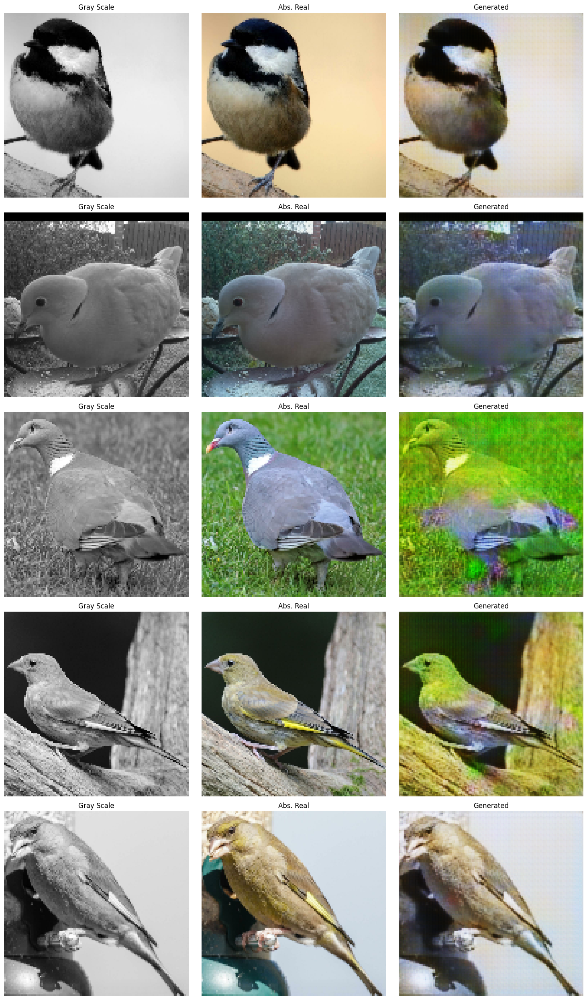

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

np.random.seed(None)

n_examples = 5

val_batches = list(val_dataset)
n_batches = len(val_batches)

rand_batch_indices = np.random.choice(n_batches, n_examples, replace=False)

gray_val_disp = []
color_val = []
gen_output = []

for b_idx in rand_batch_indices:
    gray_batch, color_batch = val_batches[b_idx]
    rand_idx = np.random.choice(gray_batch.shape[0])
    gray_img = gray_batch[rand_idx]
    color_img = color_batch[rand_idx]

    input_tensor = tf.expand_dims(gray_img, axis=0)

    try:
        gen_img = generator(input_tensor, training=False)
    except Exception as e:
        print("Error during generator call:", e)
        raise
    gen_img = tf.squeeze(gen_img, axis=0)

    gray_val_disp.append(gray_img.numpy())
    color_val.append(color_img.numpy())
    gen_output.append(gen_img.numpy())

plt.figure(figsize=(15, 5 * n_examples))
for i in range(n_examples):
    plt.subplot(n_examples, 3, i * 3 + 1)
    plt.imshow(np.squeeze(gray_val_disp[i]), cmap='gray')
    plt.title("Gray Scale")
    plt.axis('off')

    plt.subplot(n_examples, 3, i * 3 + 2)
    plt.imshow((color_val[i] + 1) / 2)
    plt.title("Abs. Real")
    plt.axis('off')

    plt.subplot(n_examples, 3, i * 3 + 3)
    plt.imshow((gen_output[i] + 1) / 2)
    plt.title("Generated")
    plt.axis('off')

plt.tight_layout()
plt.show()


## Train 2

### Train and test

In [ ]:
import time

EPOCHS = 10
for epoch in range(EPOCHS):
    start = time.time()
    print("Epoch:", epoch + 1)

    total_gen_loss = 0
    total_disc_loss = 0
    steps = 0

    for gray_batch, color_batch in train_dataset:
        g_loss, d_loss = train_step(gray_batch, color_batch, use_l1=True, LAMBDA=100)
        total_gen_loss += g_loss
        total_disc_loss += d_loss
        steps += 1
        if steps % 100 == 0:
            print("Step:", steps, "Gen Loss:", g_loss.numpy(), "Disc Loss:", d_loss.numpy())

    print("Epoch {} completed in {:.2f} sec.".format(epoch + 1, time.time() - start))
    print("Average Generator Loss:", (total_gen_loss/steps).numpy())
    print("Average Discriminator Loss:", (total_disc_loss/steps).numpy())

import matplotlib.pyplot as plt
import numpy as np

def generate_with_tta(input_batch):
    output_orig = generator(input_batch, training=False)
    flipped = tf.image.flip_left_right(input_batch)
    output_flipped = generator(flipped, training=False)
    output_flipped = tf.image.flip_left_right(output_flipped)
    return (output_orig + output_flipped) / 2.0

for gray_val, color_val in val_dataset.take(1):
    gen_output = generate_with_tta(gray_val)
    gen_output = (gen_output + 1) / 2.0
    color_val = (color_val + 1) / 2.0
    gray_val_disp = (gray_val + 1) / 2.0

Epoch: 1
Step: 100 Gen Loss: 12.415952 Disc Loss: 2.3608131
Step: 200 Gen Loss: 11.378651 Disc Loss: 1.4650474
Epoch 1 completed in 5.66 sec.
Average Generator Loss: 13.284216
Average Discriminator Loss: 0.9409685
Epoch: 2
Step: 100 Gen Loss: 14.87848 Disc Loss: 1.0029023
Step: 200 Gen Loss: 12.905542 Disc Loss: 0.41605586
Epoch 2 completed in 5.63 sec.
Average Generator Loss: 13.41709
Average Discriminator Loss: 0.8945338
Epoch: 3
Step: 100 Gen Loss: 16.25759 Disc Loss: 0.34927437
Step: 200 Gen Loss: 12.216306 Disc Loss: 1.19278
Epoch 3 completed in 5.65 sec.
Average Generator Loss: 13.550435
Average Discriminator Loss: 0.853553
Epoch: 4
Step: 100 Gen Loss: 13.907667 Disc Loss: 0.5643387
Step: 200 Gen Loss: 12.728889 Disc Loss: 1.2822812
Epoch 4 completed in 5.68 sec.
Average Generator Loss: 13.812582
Average Discriminator Loss: 0.73531157
Epoch: 5
Step: 100 Gen Loss: 16.810509 Disc Loss: 0.07407457
Step: 200 Gen Loss: 16.175472 Disc Loss: 0.082703926
Epoch 5 completed in 5.64 sec.
Av

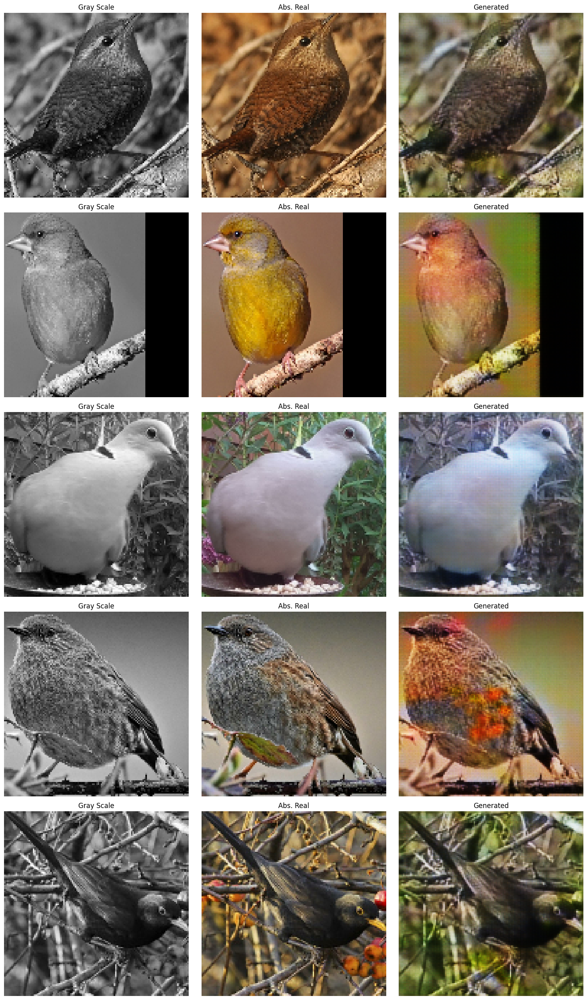

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

np.random.seed(None)

n_examples = 5

val_batches = list(val_dataset)
n_batches = len(val_batches)

rand_batch_indices = np.random.choice(n_batches, n_examples, replace=False)

gray_val_disp = []
color_val = []
gen_output = []

for b_idx in rand_batch_indices:
    gray_batch, color_batch = val_batches[b_idx]
    rand_idx = np.random.choice(gray_batch.shape[0])
    gray_img = gray_batch[rand_idx]
    color_img = color_batch[rand_idx]

    input_tensor = tf.expand_dims(gray_img, axis=0)

    try:
        gen_img = generator(input_tensor, training=False)
    except Exception as e:
        print("Error during generator call:", e)
        raise
    gen_img = tf.squeeze(gen_img, axis=0)

    gray_val_disp.append(gray_img.numpy())
    color_val.append(color_img.numpy())
    gen_output.append(gen_img.numpy())

plt.figure(figsize=(15, 5 * n_examples))
for i in range(n_examples):
    plt.subplot(n_examples, 3, i * 3 + 1)
    plt.imshow(np.squeeze(gray_val_disp[i]), cmap='gray')
    plt.title("Gray Scale")
    plt.axis('off')

    plt.subplot(n_examples, 3, i * 3 + 2)
    plt.imshow((color_val[i] + 1) / 2)
    plt.title("Abs. Real")
    plt.axis('off')

    plt.subplot(n_examples, 3, i * 3 + 3)
    plt.imshow((gen_output[i] + 1) / 2)
    plt.title("Generated")
    plt.axis('off')

plt.tight_layout()
plt.show()


## Train 3

### Train and test

total epochs - 17

In [ ]:
import time

EPOCHS = 2
for epoch in range(EPOCHS):
    start = time.time()
    print("Epoch:", epoch + 1)

    total_gen_loss = 0
    total_disc_loss = 0
    steps = 0

    for gray_batch, color_batch in train_dataset:
        g_loss, d_loss = train_step(gray_batch, color_batch, use_l1=True, LAMBDA=100)
        total_gen_loss += g_loss
        total_disc_loss += d_loss
        steps += 1
        if steps % 100 == 0:
            print("Step:", steps, "Gen Loss:", g_loss.numpy(), "Disc Loss:", d_loss.numpy())

    print("Epoch {} completed in {:.2f} sec.".format(epoch + 1, time.time() - start))
    print("Average Generator Loss:", (total_gen_loss/steps).numpy())
    print("Average Discriminator Loss:", (total_disc_loss/steps).numpy())

import matplotlib.pyplot as plt
import numpy as np

def generate_with_tta(input_batch):
    output_orig = generator(input_batch, training=False)
    flipped = tf.image.flip_left_right(input_batch)
    output_flipped = generator(flipped, training=False)
    output_flipped = tf.image.flip_left_right(output_flipped)
    return (output_orig + output_flipped) / 2.0

for gray_val, color_val in val_dataset.take(1):
    gen_output = generate_with_tta(gray_val)
    gen_output = (gen_output + 1) / 2.0
    color_val = (color_val + 1) / 2.0
    gray_val_disp = (gray_val + 1) / 2.0

Epoch: 1
Step: 100 Gen Loss: 20.26585 Disc Loss: 0.002924073
Step: 200 Gen Loss: 14.604876 Disc Loss: 0.16652718
Epoch 1 completed in 5.64 sec.
Average Generator Loss: 17.49402
Average Discriminator Loss: 0.033278916
Epoch: 2
Step: 100 Gen Loss: 16.703934 Disc Loss: 0.0111783575
Step: 200 Gen Loss: 19.685041 Disc Loss: 0.007897296
Epoch 2 completed in 5.74 sec.
Average Generator Loss: 17.731575
Average Discriminator Loss: 0.113235354
time: 11.5 s (started: 2025-03-19 19:23:42 +00:00)


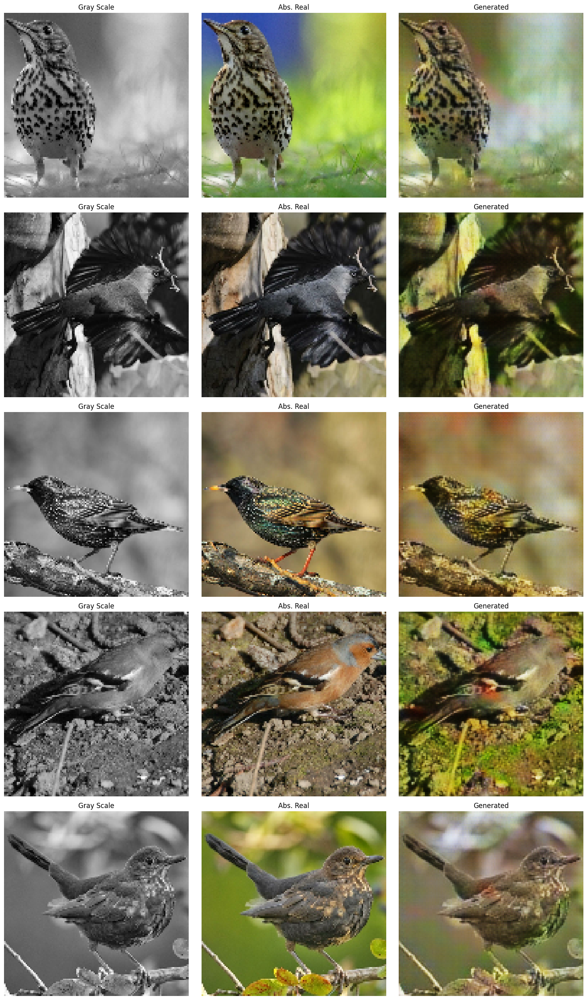

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

np.random.seed(None)

n_examples = 5

val_batches = list(val_dataset)
n_batches = len(val_batches)

rand_batch_indices = np.random.choice(n_batches, n_examples, replace=False)

gray_val_disp = []
color_val = []
gen_output = []

for b_idx in rand_batch_indices:
    gray_batch, color_batch = val_batches[b_idx]
    rand_idx = np.random.choice(gray_batch.shape[0])
    gray_img = gray_batch[rand_idx]
    color_img = color_batch[rand_idx]

    input_tensor = tf.expand_dims(gray_img, axis=0)

    try:
        gen_img = generator(input_tensor, training=False)
    except Exception as e:
        print("Error during generator call:", e)
        raise
    gen_img = tf.squeeze(gen_img, axis=0)

    gray_val_disp.append(gray_img.numpy())
    color_val.append(color_img.numpy())
    gen_output.append(gen_img.numpy())

plt.figure(figsize=(15, 5 * n_examples))
for i in range(n_examples):
    plt.subplot(n_examples, 3, i * 3 + 1)
    plt.imshow(np.squeeze(gray_val_disp[i]), cmap='gray')
    plt.title("Gray Scale")
    plt.axis('off')

    plt.subplot(n_examples, 3, i * 3 + 2)
    plt.imshow((color_val[i] + 1) / 2)
    plt.title("Abs. Real")
    plt.axis('off')

    plt.subplot(n_examples, 3, i * 3 + 3)
    plt.imshow((gen_output[i] + 1) / 2)
    plt.title("Generated")
    plt.axis('off')

plt.tight_layout()
plt.show()


## Save model

**Key Observations:**

- Visual Quality: Early training improved overall color accuracy, and the inclusion of skip connections helped maintain fine details.
- Loss Convergence: The combined loss plot (showing generator and discriminator losses) provided useful feedback for adjusting training schedules.
- TTA in interface made improvement within test plots


In [ ]:
import os
os.makedirs("saved_models_cnn", exist_ok=True)


time: 566 µs (started: 2025-03-19 19:23:54 +00:00)


In [ ]:
generator.save(f"saved_models_cnn/generator_epoch_47.h5")

time: 352 ms (started: 2025-03-19 19:23:54 +00:00)


# Model 2 - MobileNet Transfer Generator

**Explore an alternative generator architecture by incorporating a pre-trained MobileNetV2 encoder into the U-Net framework. The idea is to leverage transfer learning to capture robust feature representations while maintaining the benefits of skip connections for high-quality colorization.**

## Data augmentation

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

train_datagen = ImageDataGenerator(
    rotation_range=30,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='reflect',
)


test_datagen  = ImageDataGenerator()

train_rgb_generator = train_datagen.flow_from_directory(
    directory=train_path,
    target_size=(128, 128),
    batch_size=10,
    class_mode=None,
    shuffle=True
)

test_rgb_generator = test_datagen.flow_from_directory(
    directory=test_path,
    target_size=(128, 128),
    batch_size=10,
    class_mode=None,
    shuffle=True
)


def colorization_generator(rgb_generator):
    while True:
        batch = next(rgb_generator)

        batch = (batch - 127.5) / 127.5

        batch_gray = tf.image.rgb_to_grayscale(batch)
        batch_gray_3ch = tf.image.grayscale_to_rgb(batch_gray)

        yield (batch_gray_3ch, batch)

train_generator = colorization_generator(train_rgb_generator)
test_generator  = colorization_generator(test_rgb_generator)


Found 2270 images belonging to 20 classes.
Found 571 images belonging to 20 classes.
time: 114 ms (started: 2025-03-19 19:23:54 +00:00)


## Generator

**Generator Architecture & Hyperparameters:**

**Encoder:**
- Utilizes MobileNetV2 (with ImageNet weights) as the backbone.
- The network is modified by unfreezing the last 20 layers to allow fine-tuning on the bird dataset.
- Skip connections are extracted from several key blocks (e.g., block_1, block_3, block_6, block_13, grayscale) to preserve multi-scale features.

**Decoder:**
- Built with Conv2DTranspose layers, batch normalization, and ReLU activations.
- Final output is produced with a tanh activation.

In [ ]:
import tensorflow.keras as keras
import tensorflow as tf
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, Model

def build_mobilenetv2_unet_generator(
    input_shape=(128,128,3),
    num_classes=3,
    unfreeze_layers=20
):

    inputs = layers.Input(shape=input_shape, name="grayscale_input")

    skip_grayscale = inputs

    mobilenet = MobileNetV2(input_tensor=inputs, include_top=False, weights='imagenet')

    for layer in mobilenet.layers:
        layer.trainable = False

    if unfreeze_layers > 0:
        for layer in mobilenet.layers[-unfreeze_layers:]:
            layer.trainable = True

    skip1 = mobilenet.get_layer('block_1_expand_relu').output
    skip2 = mobilenet.get_layer('block_3_expand_relu').output
    skip3 = mobilenet.get_layer('block_6_expand_relu').output
    skip4 = mobilenet.get_layer('block_13_expand_relu').output
    encoder_output = mobilenet.get_layer('block_16_project').output


    d1 = layers.Conv2DTranspose(256, kernel_size=4, strides=2, padding='same')(encoder_output)
    d1 = layers.BatchNormalization()(d1)
    d1 = layers.ReLU()(d1)
    d1 = layers.Concatenate()([d1, skip4])


    d2 = layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding='same')(d1)
    d2 = layers.BatchNormalization()(d2)
    d2 = layers.ReLU()(d2)
    d2 = layers.Concatenate()([d2, skip3])

    d3 = layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding='same')(d2)
    d3 = layers.BatchNormalization()(d3)
    d3 = layers.ReLU()(d3)
    d3 = layers.Concatenate()([d3, skip2])

    d4 = layers.Conv2DTranspose(32, kernel_size=4, strides=2, padding='same')(d3)
    d4 = layers.BatchNormalization()(d4)
    d4 = layers.ReLU()(d4)
    d4 = layers.Concatenate()([d4, skip1])

    d5 = layers.Conv2DTranspose(16, kernel_size=4, strides=2, padding='same')(d4)
    d5 = layers.BatchNormalization()(d5)
    d5 = layers.ReLU()(d5)

    d5 = layers.Concatenate()([d5, skip_grayscale])
    d5 = layers.Conv2D(16, kernel_size=3, padding='same')(d5)
    d5 = layers.BatchNormalization()(d5)
    d5 = layers.ReLU()(d5)

    outputs = layers.Conv2D(num_classes, 1, activation='tanh')(d5)

    model = Model(inputs=inputs, outputs=outputs, name="MobileNetV2_UNet_TransConv")
    return model

generator = build_mobilenetv2_unet_generator()
generator.summary()


<ipython-input-20-b02c7ae904ac>:17: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(input_tensor=inputs, include_top=False, weights='imagenet')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "MobileNetV2_UNet_TransConv"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ grayscale_input           │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 64, 64, 32)     │            864 │ grayscale_input[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 64, 64, 32)     │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 64, 64, 32)     │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 64, 64, 32)     │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 64, 64, 32)     │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 64, 64, 32)     │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 64, 64, 16)     │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 64, 64, 16)     │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 64, 64, 96)     │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 64, 64, 96)     │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 64, 64, 96)     │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 65, 65, 96)     │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 32, 32, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 5,328,931 (20.33 MB)

 Trainable params: 4,279,203 (16.32 MB)

 Non-trainable params: 1,049,728 (4.00 MB)

time: 2.94 s (started: 2025-03-19 19:23:54 +00:00)


## Descriminator

Patch size 70x70 (receptive field)
* batch notmaliztion
* LeakyRelu(0.2)
* DropOut(0.2-0.3)

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

def build_improved_discriminator(input_shape=(128,128,3), ndf=64):

    inp = layers.Input(shape=input_shape, name='input_image')
    tar = layers.Input(shape=input_shape, name='target_image')

    x = layers.Concatenate()([inp, tar])

    d1 = layers.Conv2D(ndf, 4, strides=2, padding='same',
                       kernel_initializer=tf.random_normal_initializer(0., 0.02))(x)
    d1 = layers.LeakyReLU(0.2)(d1)

    d2 = layers.Conv2D(ndf * 2, 4, strides=2, padding='same')(d1)
    d2 = layers.BatchNormalization()(d2)
    d2 = layers.LeakyReLU(0.2)(d2)
    d2 = layers.Dropout(0.2)(d2)

    d3 = layers.Conv2D(ndf * 4, 4, strides=2, padding='same')(d2)
    d3 = layers.BatchNormalization()(d3)
    d3 = layers.LeakyReLU(0.2)(d3)
    d3 = layers.Dropout(0.3)(d3)

    d4 = layers.Conv2D(ndf * 8, 4, strides=1, padding='same')(d3)
    d4 = layers.BatchNormalization()(d4)
    d4 = layers.LeakyReLU(0.2)(d4)
    d4 = layers.Dropout(0.3)(d4)

    patch_out = layers.Conv2D(1, 4, strides=1, padding='same')(d4)
    out = layers.Activation('sigmoid')(patch_out)

    return tf.keras.Model(inputs=[inp, tar], outputs=out, name="Improved_Discriminator")

discriminator = build_improved_discriminator()
discriminator.summary()


Model: "Improved_Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ target_image (InputLayer) │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_12            │ (None, 128, 128, 6)    │              0 │ input_image[0][0],     │
│ (Concatenate)             │                        │                │ target_image[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_14 (Conv2D)        │ (None, 64, 64, 64)     │          6,208 │ concatenate_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_10            │ (None, 64, 64, 64)     │              0 │ conv2d_14[0][0]        │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_15 (Conv2D)        │ (None, 32, 32, 128)    │        131,200 │ leaky_re_lu_10[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_20    │ (None, 32, 32, 128)    │            512 │ conv2d_15[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_11            │ (None, 32, 32, 128)    │              0 │ batch_normalization_2… │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 32, 32, 128)    │              0 │ leaky_re_lu_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_16 (Conv2D)        │ (None, 16, 16, 256)    │        524,544 │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_21    │ (None, 16, 16, 256)    │          1,024 │ conv2d_16[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_12            │ (None, 16, 16, 256)    │              0 │ batch_normalization_2… │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 16, 16, 256)    │              0 │ leaky_re_lu_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_17 (Conv2D)        │ (None, 16, 16, 512)    │      2,097,664 │ dropout_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_22    │ (None, 16, 16, 512)    │          2,048 │ conv2d_17[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_13            │ (None, 16, 16, 512)    │              0 │ batch_normalization_2… │
│ (LeakyReLU)          

 Total params: 2,771,393 (10.57 MB)

 Trainable params: 2,769,601 (10.57 MB)

 Non-trainable params: 1,792 (7.00 KB)

time: 316 ms (started: 2025-03-19 19:23:57 +00:00)


## Define loss - Discriminator and Generator

In [ ]:
bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)

def discriminator_loss(real_output, fake_output):
    real_loss = bce_loss(tf.ones_like(real_output), real_output)
    fake_loss = bce_loss(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output, gen_output, target, LAMBDA=100):

    adv_loss = bce_loss(tf.ones_like(fake_output), fake_output)

    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_loss = adv_loss + (LAMBDA * l1_loss)
    return total_loss

gen_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)



time: 5.04 ms (started: 2025-03-19 19:23:58 +00:00)


## Train step

**Training Settings:**
- Loss functions and learning rates remain the same as in Experiment 1.
- Data augmentation is enhanced with random rotations, shear, zoom, and horizontal flips.

**Training Strategy:**

Total epochs:115.

The training is carried out in multiple phases:

- Train 1 - continuous training of 20 epoches
- Train 2 - continuous training of 5 epoches
- Train 3 - discontinuous manual training of 1-5 epochs + evaluation using visual test plots, total - 10 epochs
- Train 4 - discontinuous manual training of 1-5 epochs + evaluation using visual test plots, total - 40 epochs
- Train 5 - discontinuous manual training of 1-5 epochs + evaluation using visual test plots, total - 40 epochs


In [ ]:
@tf.function
def train_step(input_image, target_image, lambda_recon=100):
    """
    input_image: grayscale 3-ch in [-1,1]
    target_image: real color image in [-1,1]
    """

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target_image], training=True)
        disc_fake_output = discriminator([input_image, gen_output], training=True)

        gen_loss = generator_loss(disc_fake_output, gen_output, target_image, LAMBDA=lambda_recon)
        disc_loss = discriminator_loss(disc_real_output, disc_fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss


time: 788 µs (started: 2025-03-19 19:23:58 +00:00)


## Train 1

### Train and test

In [ ]:
EPOCHS = 20
steps_per_epoch = len(train_rgb_generator)
lambda_recon = 100

for epoch in range(EPOCHS):
    print(f"Epoch {epoch+1}/{EPOCHS}")

    total_gen_loss = 0.0
    total_disc_loss = 0.0

    for step in range(steps_per_epoch):
        input_batch, target_batch = next(train_generator)
        gen_loss, disc_loss = train_step(input_batch, target_batch, lambda_recon=lambda_recon)

        total_gen_loss += gen_loss
        total_disc_loss += disc_loss

        if step % 50 == 0:
            print(f" Step {step}: Gen Loss = {gen_loss.numpy():.4f}, Disc Loss = {disc_loss.numpy():.4f}")

    avg_gen_loss = total_gen_loss / steps_per_epoch
    avg_disc_loss = total_disc_loss / steps_per_epoch
    print(f"[Epoch {epoch+1}] Avg Gen Loss: {avg_gen_loss:.4f} | Avg Disc Loss: {avg_disc_loss:.4f}\n")


Epoch 1/20
 Step 0: Gen Loss = 70.6476, Disc Loss = 1.6517
 Step 50: Gen Loss = 47.3057, Disc Loss = 0.1117
 Step 100: Gen Loss = 42.7185, Disc Loss = 0.0626
 Step 150: Gen Loss = 32.9069, Disc Loss = 0.1186
 Step 200: Gen Loss = 20.6202, Disc Loss = 1.3397
[Epoch 1] Avg Gen Loss: 38.2080 | Avg Disc Loss: 0.3309

Epoch 2/20
 Step 0: Gen Loss = 22.3813, Disc Loss = 0.0792
 Step 50: Gen Loss = 17.4859, Disc Loss = 0.6163
 Step 100: Gen Loss = 21.0900, Disc Loss = 0.7540
 Step 150: Gen Loss = 19.1861, Disc Loss = 0.1247
 Step 200: Gen Loss = 18.4256, Disc Loss = 0.5114
[Epoch 2] Avg Gen Loss: 20.3857 | Avg Disc Loss: 0.3316

Epoch 3/20
 Step 0: Gen Loss = 17.2981, Disc Loss = 0.0645
 Step 50: Gen Loss = 16.7854, Disc Loss = 1.0607
 Step 100: Gen Loss = 17.5730, Disc Loss = 0.0973
 Step 150: Gen Loss = 20.1317, Disc Loss = 0.0681
 Step 200: Gen Loss = 20.9538, Disc Loss = 0.0132
[Epoch 3] Avg Gen Loss: 18.9148 | Avg Disc Loss: 0.2978

Epoch 4/20
 Step 0: Gen Loss = 18.8584, Disc Loss = 0.0

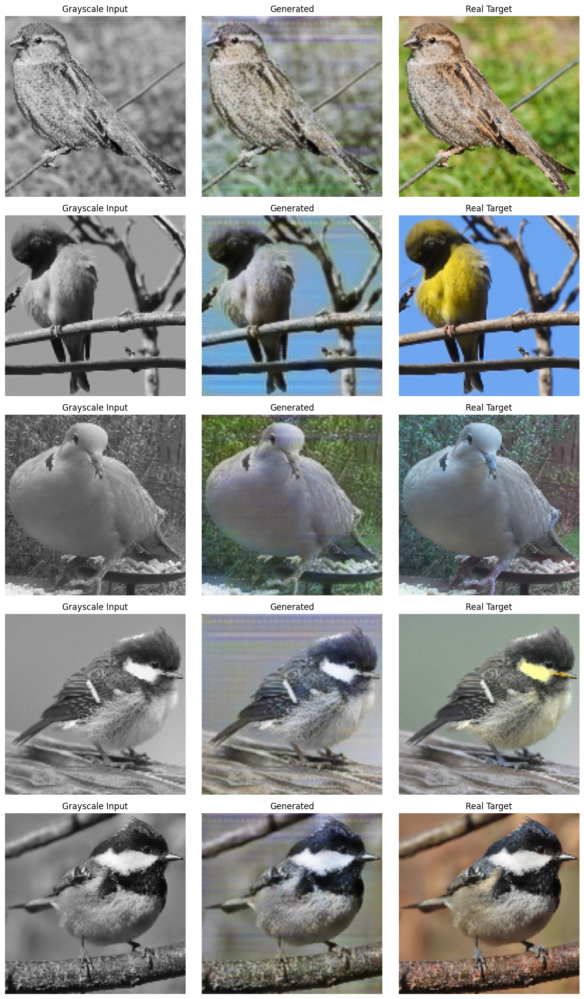

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

num_images_to_show = 5
input_images = []
target_images = []

for i in range(num_images_to_show):
    in_img, tgt_img = next(test_generator)
    input_images.append(in_img[0])
    target_images.append(tgt_img[0])

input_images = np.stack(input_images, axis=0)
target_images = np.stack(target_images, axis=0)

gen_out = generator(input_images, training=False).numpy()

def denorm(x):
    return (x + 1.) / 2.

fig, axs = plt.subplots(num_images_to_show, 3, figsize=(12, 4 * num_images_to_show))

for i in range(num_images_to_show):
    gray_img = denorm(input_images[i])
    gen_img  = denorm(gen_out[i])
    real_img = denorm(target_images[i])

    axs[i, 0].imshow(gray_img)
    axs[i, 0].set_title("Grayscale Input")
    axs[i, 0].axis('off')

    axs[i, 1].imshow(gen_img)
    axs[i, 1].set_title("Generated")
    axs[i, 1].axis('off')

    axs[i, 2].imshow(real_img)
    axs[i, 2].set_title("Real Target")
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()


## Train 2


### Train and test

In [ ]:
EPOCHS = 5
steps_per_epoch = len(train_rgb_generator)
lambda_recon = 100

for epoch in range(EPOCHS):
    print(f"Epoch {epoch+1}/{EPOCHS}")

    total_gen_loss = 0.0
    total_disc_loss = 0.0

    for step in range(steps_per_epoch):
        input_batch, target_batch = next(train_generator)
        gen_loss, disc_loss = train_step(input_batch, target_batch, lambda_recon=lambda_recon)

        total_gen_loss += gen_loss
        total_disc_loss += disc_loss

        if step % 50 == 0:
            print(f" Step {step}: Gen Loss = {gen_loss.numpy():.4f}, Disc Loss = {disc_loss.numpy():.4f}")

    avg_gen_loss = total_gen_loss / steps_per_epoch
    avg_disc_loss = total_disc_loss / steps_per_epoch
    print(f"[Epoch {epoch+1}] Avg Gen Loss: {avg_gen_loss:.4f} | Avg Disc Loss: {avg_disc_loss:.4f}\n")


Epoch 1/5
 Step 0: Gen Loss = 18.1111, Disc Loss = 0.0016
 Step 50: Gen Loss = 19.4731, Disc Loss = 0.0024
 Step 100: Gen Loss = 19.5931, Disc Loss = 0.0011
 Step 150: Gen Loss = 21.5370, Disc Loss = 0.0017
 Step 200: Gen Loss = 18.5521, Disc Loss = 0.0018
[Epoch 1] Avg Gen Loss: 19.1791 | Avg Disc Loss: 0.0021

Epoch 2/5
 Step 0: Gen Loss = 19.2189, Disc Loss = 0.0012
 Step 50: Gen Loss = 28.9382, Disc Loss = 0.0011
 Step 100: Gen Loss = 21.4432, Disc Loss = 0.0010
 Step 150: Gen Loss = 15.6652, Disc Loss = 0.0032
 Step 200: Gen Loss = 21.1325, Disc Loss = 0.0008
[Epoch 2] Avg Gen Loss: 19.4011 | Avg Disc Loss: 0.0018

Epoch 3/5
 Step 0: Gen Loss = 17.5887, Disc Loss = 0.0017
 Step 50: Gen Loss = 17.9693, Disc Loss = 0.0011
 Step 100: Gen Loss = 18.1631, Disc Loss = 0.0017
 Step 150: Gen Loss = 20.1219, Disc Loss = 0.0006
 Step 200: Gen Loss = 27.3032, Disc Loss = 0.0007
[Epoch 3] Avg Gen Loss: 19.7423 | Avg Disc Loss: 0.0014

Epoch 4/5
 Step 0: Gen Loss = 18.4585, Disc Loss = 0.0008


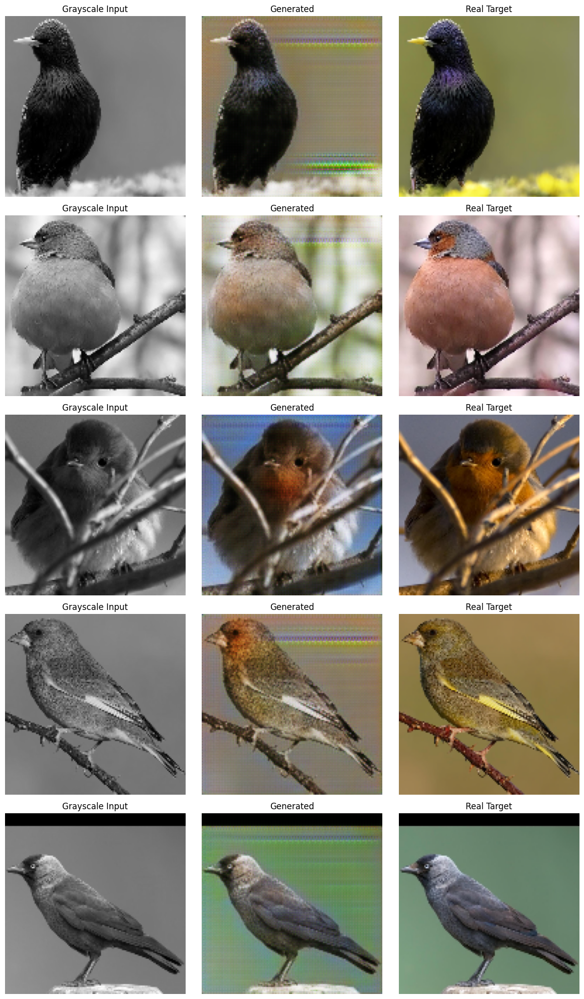

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

num_images_to_show = 5
input_images = []
target_images = []

for i in range(num_images_to_show):
    in_img, tgt_img = next(test_generator)
    input_images.append(in_img[0])
    target_images.append(tgt_img[0])

input_images = np.stack(input_images, axis=0)
target_images = np.stack(target_images, axis=0)

gen_out = generator(input_images, training=False).numpy()

def denorm(x):
    return (x + 1.) / 2.

fig, axs = plt.subplots(num_images_to_show, 3, figsize=(12, 4 * num_images_to_show))

for i in range(num_images_to_show):
    gray_img = denorm(input_images[i])
    gen_img  = denorm(gen_out[i])
    real_img = denorm(target_images[i])

    axs[i, 0].imshow(gray_img)
    axs[i, 0].set_title("Grayscale Input")
    axs[i, 0].axis('off')

    axs[i, 1].imshow(gen_img)
    axs[i, 1].set_title("Generated")
    axs[i, 1].axis('off')

    axs[i, 2].imshow(real_img)
    axs[i, 2].set_title("Real Target")
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()


## Train 3



### Train and test


epoch 20-35

In [ ]:
EPOCHS = 15
steps_per_epoch = len(train_rgb_generator)
lambda_recon = 100

for epoch in range(EPOCHS):
    print(f"Epoch {epoch+1}/{EPOCHS}")

    total_gen_loss = 0.0
    total_disc_loss = 0.0

    for step in range(steps_per_epoch):
        input_batch, target_batch = next(train_generator)
        gen_loss, disc_loss = train_step(input_batch, target_batch, lambda_recon=lambda_recon)

        total_gen_loss += gen_loss
        total_disc_loss += disc_loss

        if step % 50 == 0:
            print(f" Step {step}: Gen Loss = {gen_loss.numpy():.4f}, Disc Loss = {disc_loss.numpy():.4f}")

    avg_gen_loss = total_gen_loss / steps_per_epoch
    avg_disc_loss = total_disc_loss / steps_per_epoch
    print(f"[Epoch {epoch+1}] Avg Gen Loss: {avg_gen_loss:.4f} | Avg Disc Loss: {avg_disc_loss:.4f}\n")


Epoch 1/15
 Step 0: Gen Loss = 21.7812, Disc Loss = 0.0617
 Step 50: Gen Loss = 16.9812, Disc Loss = 0.0075
 Step 100: Gen Loss = 12.9580, Disc Loss = 0.0387
 Step 150: Gen Loss = 12.9337, Disc Loss = 0.0102
 Step 200: Gen Loss = 15.4808, Disc Loss = 1.0741
[Epoch 1] Avg Gen Loss: 14.7265 | Avg Disc Loss: 0.4525

Epoch 2/15
 Step 0: Gen Loss = 14.5070, Disc Loss = 0.3833
 Step 50: Gen Loss = 17.2760, Disc Loss = 0.0533
 Step 100: Gen Loss = 24.4510, Disc Loss = 0.0059
 Step 150: Gen Loss = 11.0260, Disc Loss = 0.1446
 Step 200: Gen Loss = 14.4784, Disc Loss = 0.0188
[Epoch 2] Avg Gen Loss: 14.7096 | Avg Disc Loss: 0.3855

Epoch 3/15
 Step 0: Gen Loss = 20.2976, Disc Loss = 0.0123
 Step 50: Gen Loss = 13.7664, Disc Loss = 0.0113
 Step 100: Gen Loss = 15.7947, Disc Loss = 0.0033
 Step 150: Gen Loss = 18.4649, Disc Loss = 0.0021
 Step 200: Gen Loss = 18.2824, Disc Loss = 0.0034
[Epoch 3] Avg Gen Loss: 16.7813 | Avg Disc Loss: 0.0103

Epoch 4/15
 Step 0: Gen Loss = 16.2281, Disc Loss = 0.0

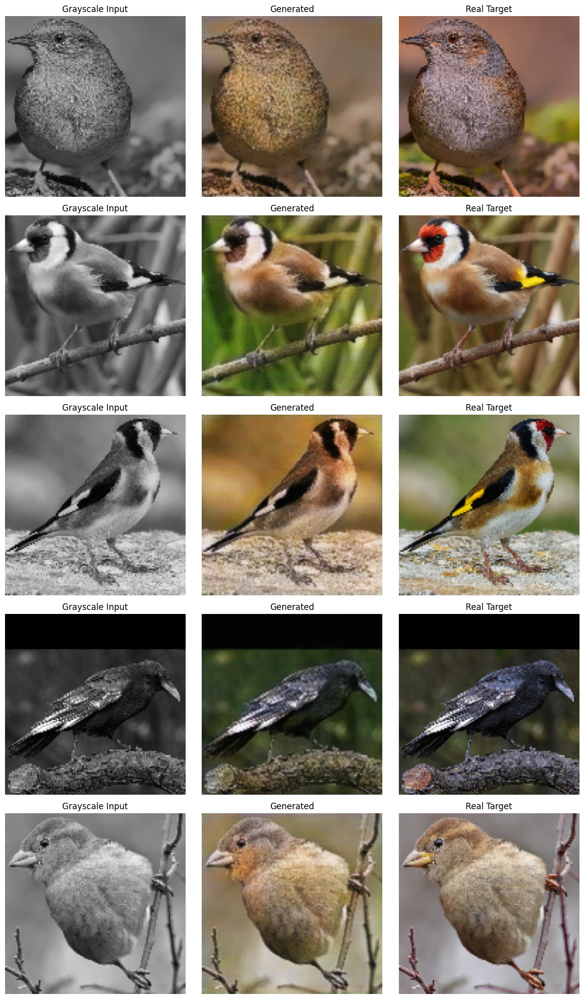

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

num_images_to_show = 5
input_images = []
target_images = []

for i in range(num_images_to_show):
    in_img, tgt_img = next(test_generator)
    input_images.append(in_img[0])
    target_images.append(tgt_img[0])

input_images = np.stack(input_images, axis=0)
target_images = np.stack(target_images, axis=0)

gen_out = generator(input_images, training=False).numpy()

def denorm(x):
    return (x + 1.) / 2.

fig, axs = plt.subplots(num_images_to_show, 3, figsize=(12, 4 * num_images_to_show))

for i in range(num_images_to_show):
    gray_img = denorm(input_images[i])
    gen_img  = denorm(gen_out[i])
    real_img = denorm(target_images[i])

    axs[i, 0].imshow(gray_img)
    axs[i, 0].set_title("Grayscale Input")
    axs[i, 0].axis('off')

    axs[i, 1].imshow(gen_img)
    axs[i, 1].set_title("Generated")
    axs[i, 1].axis('off')

    axs[i, 2].imshow(real_img)
    axs[i, 2].set_title("Real Target")
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()


## Train 4

### Train and test

epoch 35-75

In [ ]:
EPOCHS = 1
steps_per_epoch = len(train_rgb_generator)
lambda_recon = 100

for epoch in range(EPOCHS):
    print(f"Epoch {epoch+1}/{EPOCHS}")

    total_gen_loss = 0.0
    total_disc_loss = 0.0

    for step in range(steps_per_epoch):
        input_batch, target_batch = next(train_generator)
        gen_loss, disc_loss = train_step(input_batch, target_batch, lambda_recon=lambda_recon)

        total_gen_loss += gen_loss
        total_disc_loss += disc_loss

        if step % 50 == 0:
            print(f" Step {step}: Gen Loss = {gen_loss.numpy():.4f}, Disc Loss = {disc_loss.numpy():.4f}")

    avg_gen_loss = total_gen_loss / steps_per_epoch
    avg_disc_loss = total_disc_loss / steps_per_epoch
    print(f"[Epoch {epoch+1}] Avg Gen Loss: {avg_gen_loss:.4f} | Avg Disc Loss: {avg_disc_loss:.4f}\n")


Epoch 1/1
 Step 0: Gen Loss = 17.0003, Disc Loss = 0.0006
 Step 50: Gen Loss = 19.7050, Disc Loss = 0.0006
 Step 100: Gen Loss = 17.5384, Disc Loss = 0.0005
 Step 150: Gen Loss = 19.7615, Disc Loss = 0.0004
 Step 200: Gen Loss = 17.1972, Disc Loss = 0.0005
[Epoch 1] Avg Gen Loss: 19.0197 | Avg Disc Loss: 0.0005

time: 24.7 s (started: 2025-03-19 19:40:44 +00:00)


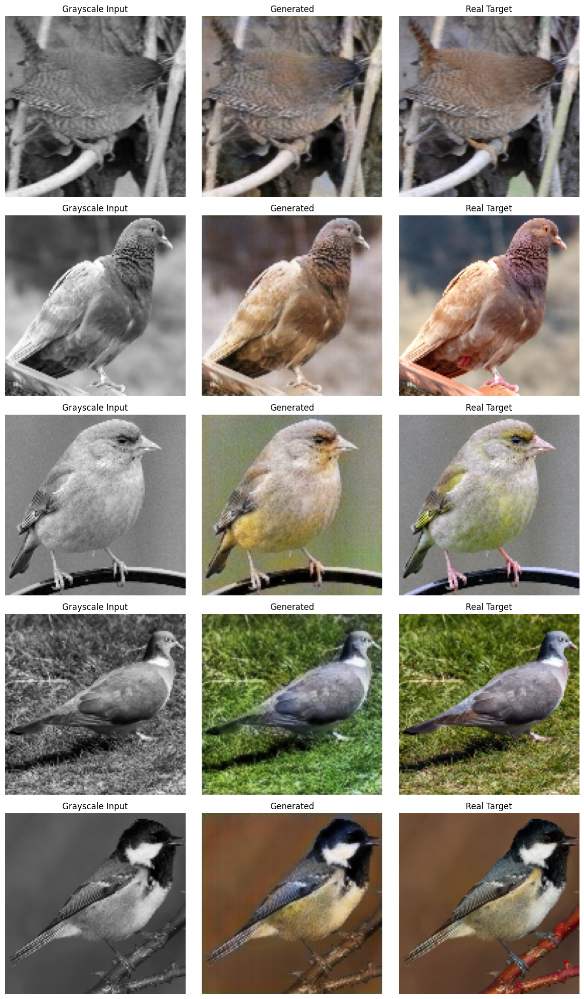

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

num_images_to_show = 5
input_images = []
target_images = []

for i in range(num_images_to_show):
    in_img, tgt_img = next(test_generator)
    input_images.append(in_img[0])
    target_images.append(tgt_img[0])

input_images = np.stack(input_images, axis=0)
target_images = np.stack(target_images, axis=0)

gen_out = generator(input_images, training=False).numpy()

def denorm(x):
    return (x + 1.) / 2.

fig, axs = plt.subplots(num_images_to_show, 3, figsize=(12, 4 * num_images_to_show))

for i in range(num_images_to_show):
    gray_img = denorm(input_images[i])
    gen_img  = denorm(gen_out[i])
    real_img = denorm(target_images[i])

    axs[i, 0].imshow(gray_img)
    axs[i, 0].set_title("Grayscale Input")
    axs[i, 0].axis('off')

    axs[i, 1].imshow(gen_img)
    axs[i, 1].set_title("Generated")
    axs[i, 1].axis('off')

    axs[i, 2].imshow(real_img)
    axs[i, 2].set_title("Real Target")
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()


## Train 5

epoch 75-115

### Train and test

In [ ]:
EPOCHS = 2
steps_per_epoch = len(train_rgb_generator)
lambda_recon = 100

for epoch in range(EPOCHS):
    print(f"Epoch {epoch+1}/{EPOCHS}")

    total_gen_loss = 0.0
    total_disc_loss = 0.0

    for step in range(steps_per_epoch):
        input_batch, target_batch = next(train_generator)
        gen_loss, disc_loss = train_step(input_batch, target_batch, lambda_recon=lambda_recon)

        total_gen_loss += gen_loss
        total_disc_loss += disc_loss

        if step % 50 == 0:
            print(f" Step {step}: Gen Loss = {gen_loss.numpy():.4f}, Disc Loss = {disc_loss.numpy():.4f}")

    avg_gen_loss = total_gen_loss / steps_per_epoch
    avg_disc_loss = total_disc_loss / steps_per_epoch
    print(f"[Epoch {epoch+1}] Avg Gen Loss: {avg_gen_loss:.4f} | Avg Disc Loss: {avg_disc_loss:.4f}\n")


Epoch 1/2
 Step 0: Gen Loss = 18.1526, Disc Loss = 0.0004
 Step 50: Gen Loss = 19.0935, Disc Loss = 0.0003
 Step 100: Gen Loss = 17.2078, Disc Loss = 0.0005
 Step 150: Gen Loss = 19.5450, Disc Loss = 0.0004
 Step 200: Gen Loss = 17.4565, Disc Loss = 0.0005
[Epoch 1] Avg Gen Loss: 18.8939 | Avg Disc Loss: 0.0005

Epoch 2/2
 Step 0: Gen Loss = 17.9977, Disc Loss = 0.0006
 Step 50: Gen Loss = 17.5663, Disc Loss = 0.0005
 Step 100: Gen Loss = 18.5325, Disc Loss = 0.0003
 Step 150: Gen Loss = 17.8500, Disc Loss = 0.0004
 Step 200: Gen Loss = 19.8238, Disc Loss = 0.0002
[Epoch 2] Avg Gen Loss: 19.3457 | Avg Disc Loss: 0.0004

time: 50 s (started: 2025-03-19 19:41:09 +00:00)


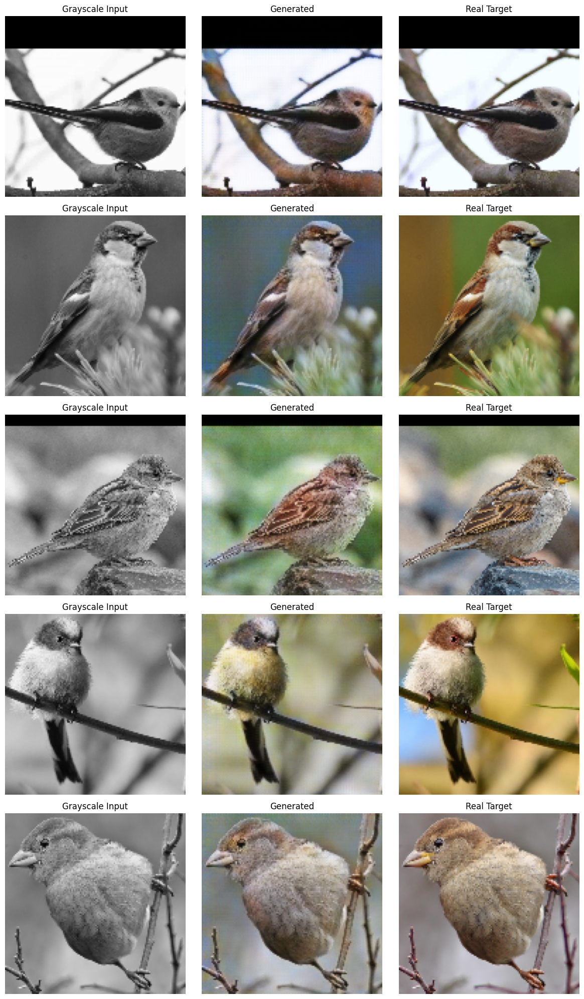

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

num_images_to_show = 5
input_images = []
target_images = []

for i in range(num_images_to_show):
    in_img, tgt_img = next(test_generator)
    input_images.append(in_img[0])
    target_images.append(tgt_img[0])

input_images = np.stack(input_images, axis=0)
target_images = np.stack(target_images, axis=0)

gen_out = generator(input_images, training=False).numpy()

def denorm(x):
    return (x + 1.) / 2.

fig, axs = plt.subplots(num_images_to_show, 3, figsize=(12, 4 * num_images_to_show))

for i in range(num_images_to_show):
    gray_img = denorm(input_images[i])
    gen_img  = denorm(gen_out[i])
    real_img = denorm(target_images[i])

    axs[i, 0].imshow(gray_img)
    axs[i, 0].set_title("Grayscale Input")
    axs[i, 0].axis('off')

    axs[i, 1].imshow(gen_img)
    axs[i, 1].set_title("Generated")
    axs[i, 1].axis('off')

    axs[i, 2].imshow(real_img)
    axs[i, 2].set_title("Real Target")
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()


## Save model

**Key Observations:**

- Improved Feature Extraction: The MobileNetV2-based encoder leverages pre-trained features that can boost performance when data is limited.
- Regularization via Unfreezing: Unfreezing a moderate number of layers (20) strikes a balance between stability and model flexibility. Unfreezing too many layers led to overfitting in our experiments.
- Visual Results: Initial tests indicate that this approach produces colorizations that are comparably detailed and robust. However, tuning the unfreezing strategy and training schedule is critical to avoid instability.
-Training Dynamics: The gradual increase in generator strength, balanced with adversarial feedback, led to more vibrant outputs. However, during later epochs (especially beyond 40+ epochs), a high discriminator loss correlated with improved visual results, whereas a near-zero loss often signaled instability.

In [ ]:
import os
os.makedirs("saved_models_cgan", exist_ok=True)


time: 664 µs (started: 2025-03-19 19:41:59 +00:00)


In [ ]:
generator.save(f"saved_models_cgan/generator_epoch_115.keras")

time: 498 ms (started: 2025-03-19 19:41:59 +00:00)


**Summary of Notebook 2 Experiments**

- Experiment 1 (Pix2Pix U-Net):
Demonstrated the effectiveness of adversarial training for image colorization with a carefully designed U-Net generator and PatchGAN discriminator. Progressive training phases and intermittent evaluations helped in identifying a sweet spot for the generator–discriminator balance.
- Experiment 2 (MobileNetV2 Transfer):
Showed promising results by integrating a pre-trained MobileNetV2 encoder. Although leveraging transfer learning improved feature extraction, careful tuning was necessary to prevent overfitting.
